# Polarity and Subjectivity

Please note that the work below relies on data files I no longer have access to (only samples of which I have saved).

The goal of this work is to produce visualisations and insights that could be shared with our client to show what customers think about their ski fields and those of their competitors.

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import altair as alt

import contractions
from textblob import TextBlob
from wordcloud import WordCloud, STOPWORDS
from nltk.stem import WordNetLemmatizer
from nltk.corpus import wordnet
from nltk import pos_tag

import nltk
from nltk.tokenize import sent_tokenize

In [2]:
fields = ['field_1', 'field_2', 'field_3']

### Approach 1 - TextBlob

A simple approach was initially taken using the TextBlob library to calculate the polarity and subjectivity of each review. The polarity score is within -1.0 to 1.0, where -1.0 is very negative and 1.0 is very positive. The subjectivity score is 0.0 to 1.0, where 0.0 is very objective and 1.0 is very subjective.

In [4]:
selected_field = fields[0]
df = pd.read_csv(f'path/to/{selected_field}.csv')
df.head()

,review_year,review_month,review_text,processed_review_text
0,2021,Oct,The ticketing process and hiring process was g...,ticket process hire process be great easy all ...
1,2021,Aug,"Excellent team, thank you Laura and the girl d...",excellent team thank you laura girl driver who...
2,2021,Jul,"Won’t go back in a hurry. Massive long lines, ...",will not go back in hurry massive long line sh...
3,2021,Mar,We spent 2 hours on the ski field riding the m...,we spent 2 hour on ski field rid mountain cart...
4,2021,Feb,Visited as a group of 4 couples and everyone h...,visit a group of 4 couple everyone have an abs...


In [10]:
df['polarity'] = df['processed_review_text'].apply(lambda x: TextBlob(x).sentiment.polarity)
df['subjectivity'] = df['processed_review_text'].apply(lambda x: TextBlob(x).sentiment.subjectivity)
df.head()

,review_year,review_month,review_text,processed_review_text,polarity,subjectivity
0,2021,Oct,The ticketing process and hiring process was g...,ticket process hire process be great easy all ...,0.207108,0.566176
1,2021,Aug,"Excellent team, thank you Laura and the girl d...",excellent team thank you laura girl driver who...,0.230000,0.610000
2,2021,Jul,"Won’t go back in a hurry. Massive long lines, ...",will not go back in hurry massive long line sh...,0.018333,0.457778
3,2021,Mar,We spent 2 hours on the ski field riding the m...,we spent 2 hour on ski field rid mountain cart...,0.029308,0.214229
4,2021,Feb,Visited as a group of 4 couples and everyone h...,visit a group of 4 couple everyone have an abs...,0.426923,0.600000


Overall, it appears that subjectivity has a weakly positive relationship with positive sentiment i.e. the more positive the review, the more subjective it will be. This makes sense as those who express strong positive sentiment may be sharing things relating to their specific experiences or using highly emotive language.

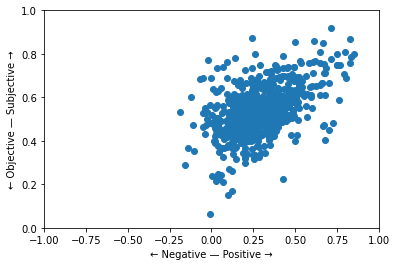

In [31]:
plt.scatter(df.polarity, df.subjectivity)
plt.xlabel('← Negative — Positive →')
plt.ylabel('← Objective — Subjective →')
plt.xlim([-1.0, 1.0])
plt.ylim([0.0, 1.0])
plt.show()

In [ ]:
# Summarise positive (> 0), negative (= 0), and neutral (< 0) sentiments
def sentiments(x):
    if x < 0: 
        return -1
    else: 
        return x > 0

In [35]:
df['analysis'] = df['polarity'].apply(sentiments)
df.head()

,review_year,review_month,review_text,processed_review_text,polarity,subjectivity,analysis
0,2021,Oct,The ticketing process and hiring process was g...,ticket process hire process be great easy all ...,0.207108,0.566176,1.0
1,2021,Aug,"Excellent team, thank you Laura and the girl d...",excellent team thank you laura girl driver who...,0.230000,0.610000,1.0
2,2021,Jul,"Won’t go back in a hurry. Massive long lines, ...",will not go back in hurry massive long line sh...,0.018333,0.457778,1.0
3,2021,Mar,We spent 2 hours on the ski field riding the m...,we spent 2 hour on ski field rid mountain cart...,0.029308,0.214229,1.0
4,2021,Feb,Visited as a group of 4 couples and everyone h...,visit a group of 4 couple everyone have an abs...,0.426923,0.600000,1.0


 1.0    664
-1.0     20
 0.0      1
Name: analysis, dtype: int64


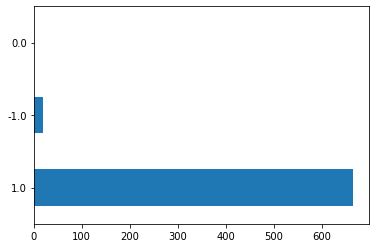

In [36]:
print(df['analysis'].value_counts())
df['analysis'].value_counts().plot(kind='barh')
plt.show()

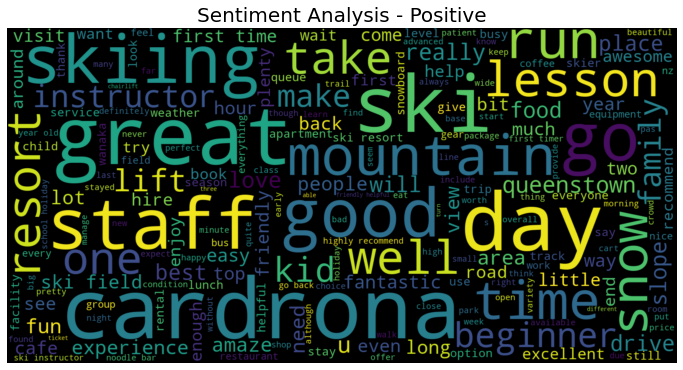

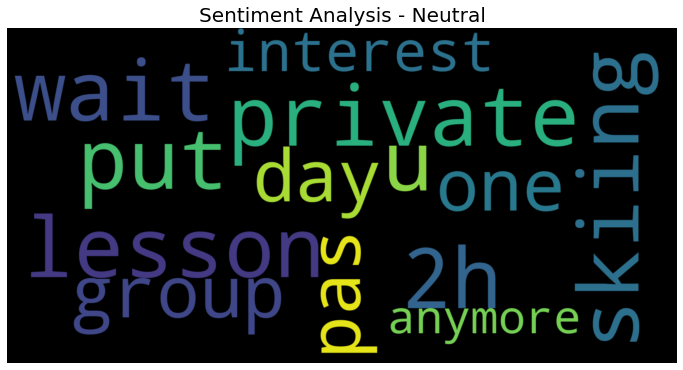

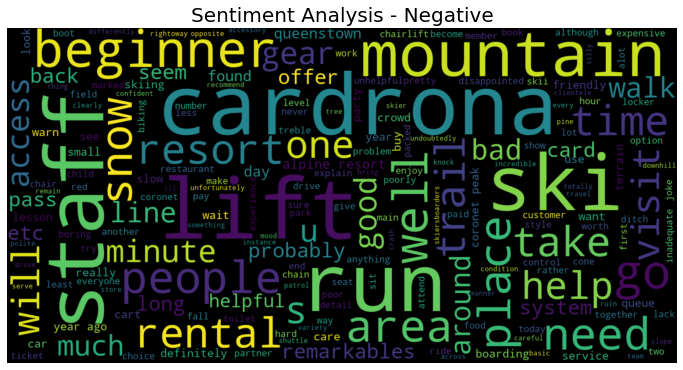

In [42]:
# Visualizing positive, negative and netural texts

sentiments = {1: 'Positive', 0: 'Neutral', -1: 'Negative'}

for sentiment in sentiments.keys():
    rows_with_current_sentiment = df[df['analysis'] == sentiment]
    list_with_current_sentiment = [text for text in rows_with_current_sentiment['processed_review_text']]
    string_with_current_sentiment = pd.Series(list_with_current_sentiment).str.cat(sep=' ')

    wordcloud = WordCloud(width=1600, height=800, max_font_size=200).generate(string_with_current_sentiment)
    plt.figure(figsize=(12,10))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.title(f'Sentiment Analysis - {sentiments[sentiment]}', fontsize=20)
    plt.show()

### Approach 2 - TextBlob + sentence tokenisation

Noting that reviews often contain multiple sentences with possibly different sentiments, each review was split up into its component sentences and tokenised for future use.

In [7]:
df = pd.DataFrame(columns=['review_year', 'review_month', 'review_text', 'source'])

for field in fields:
    reviews_df = pd.read_csv(f'path/to/{selected_field}.csv')
    reviews_df.drop('processed_review_text', axis=1, inplace=True)
    reviews_df['source'] = field
    df = pd.concat([df, reviews_df], ignore_index=True)

df.head()

,review_year,review_month,review_text,peak
0,2021,Oct,The ticketing process and hiring process was g...,cardrona
1,2021,Aug,"Excellent team, thank you Laura and the girl d...",cardrona
2,2021,Jul,"Won’t go back in a hurry. Massive long lines, ...",cardrona
3,2021,Mar,We spent 2 hours on the ski field riding the m...,cardrona
4,2021,Feb,Visited as a group of 4 couples and everyone h...,cardrona


In [ ]:
# basic preprocessing from first notebook

def expand_contractions(text):
    expanded_text = []
    for word in text.split():
        expanded_text.append(contractions.fix(word))
    return ' '.join(expanded_text)

def remove_stopwords(text):
    stops = ['a', 'the', 'and']
    tokens = [word for word in text.split() if word not in stops]
    return ' '.join(tokens)

def get_wordnet_pos(word):
    tag = nltk.pos_tag([word])[0][1][0].upper()
    tag_dict = {"J": wordnet.ADJ, "N": wordnet.NOUN, "V": wordnet.VERB, "R": wordnet.ADV}
    return tag_dict.get(tag, wordnet.NOUN)

def lemmatize(text):
    lemmatized_list = [WordNetLemmatizer().lemmatize(word, get_wordnet_pos(word)) for word in text.split()]
    return ' '.join(lemmatized_list)

def preprocess(dataframe):
    dataframe['processed_review_text'] = dataframe['review_text'].apply(lambda x: " ".join(x.lower() for x in x.split()))
    dataframe['processed_review_text'] = dataframe['processed_review_text'].apply(expand_contractions)
    dataframe['processed_review_text'] = dataframe['processed_review_text'].apply(lambda x: remove_stopwords(x))
    dataframe['processed_review_text'] = dataframe['processed_review_text'].apply(lambda x: lemmatize(x))
    return dataframe

In [8]:
df = df.drop_duplicates(subset={"review_text"}, keep='first')
df = preprocess(df)
df.head()

,review_year,review_month,review_text,peak,processed_review_text
0,2021,Oct,The ticketing process and hiring process was g...,cardrona,ticket process hire process be great easy all ...
1,2021,Aug,"Excellent team, thank you Laura and the girl d...",cardrona,"excellent team, thank you laura girl driver wh..."
2,2021,Jul,"Won’t go back in a hurry. Massive long lines, ...",cardrona,"will not go back in hurry. massive long lines,..."
3,2021,Mar,We spent 2 hours on the ski field riding the m...,cardrona,we spent 2 hour on ski field rid mountain cart...
4,2021,Feb,Visited as a group of 4 couples and everyone h...,cardrona,visit a group of 4 couple everyone have an abs...


In [9]:
df['tokenised_sentences'] = df['processed_review_text'].apply(lambda x: sent_tokenize(x))
df.drop(['review_text', 'processed_review_text'], axis=1, inplace=True)
df.head()

,review_year,review_month,peak,tokenised_sentences
0,2021,Oct,cardrona,[ticket process hire process be great easy all...
1,2021,Aug,cardrona,"[excellent team, thank you laura girl driver w..."
2,2021,Jul,cardrona,"[will not go back in hurry., massive long line..."
3,2021,Mar,cardrona,[we spent 2 hour on ski field rid mountain car...
4,2021,Feb,cardrona,[visit a group of 4 couple everyone have an ab...


In [10]:
tokenised_df = df.explode('tokenised_sentences', ignore_index=True)
tokenised_df.head()

,review_year,review_month,peak,tokenised_sentences
0,2021,Oct,cardrona,ticket process hire process be great easy all ...
1,2021,Oct,cardrona,all be well until we meet out instructor (nick...
2,2021,Oct,cardrona,it completely put our kid off.
3,2021,Oct,cardrona,we then go do our own lesson with kid with lit...
4,2021,Oct,cardrona,over all cadrona be well set up for first time...


In [134]:
# save df for topic modelling (and more preprocessing)
tokenised_df.to_csv('path/to/all_reviews_tokenised.csv', index=False)

#### Analyse sentiment

In [11]:
tokenised_df['polarity'] = tokenised_df['tokenised_sentences'].apply(lambda x: TextBlob(x).sentiment.polarity)
tokenised_df['subjectivity'] = tokenised_df['tokenised_sentences'].apply(lambda x: TextBlob(x).sentiment.subjectivity)
tokenised_df.head()

,review_year,review_month,peak,tokenised_sentences,polarity,subjectivity
0,2021,Oct,cardrona,ticket process hire process be great easy all ...,0.430556,0.569444
1,2021,Oct,cardrona,all be well until we meet out instructor (nick...,0.043750,0.668750
2,2021,Oct,cardrona,it completely put our kid off.,0.100000,0.400000
3,2021,Oct,cardrona,we then go do our own lesson with kid with lit...,0.204167,0.566667
4,2021,Oct,cardrona,over all cadrona be well set up for first time...,0.016667,0.477778


In [12]:
tokenised_df.tail()

,review_year,review_month,peak,tokenised_sentences,polarity,subjectivity
16867,2011,Jul,remarkables,we could not claim refund on adult lesson we h...,-0.080000,0.360000
16868,2011,Jul,remarkables,they would not give u refund even when i expla...,0.200000,0.556250
16869,2011,Jul,remarkables,very unhappy.,-0.780000,1.000000
16870,2011,Jul,remarkables,what waste of our hard earn money.,-0.245833,0.270833
16871,2011,Jul,remarkables,i would not recommend this ski field to anyone.,0.000000,0.000000


#### Visualise

Now we see a different relationship between polarity and subjectivity, where more subjective statements span a greater range of polarity than those that are more objective.

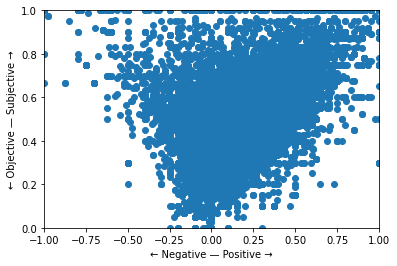

In [18]:
plt.scatter(tokenised_df.polarity, tokenised_df.subjectivity)
plt.xlabel('← Negative — Positive →')
plt.ylabel('← Objective — Subjective →', )
plt.xlim([-1.0, 1.0])
plt.ylim([0.0, 1.0])
plt.show()

Colouring the plot above by ski field

In [73]:
selection = alt.selection_multi(fields=["peak"], bind='legend')

chart = alt.Chart(tokenised_df).mark_point(size=50).encode(
    alt.X("polarity"),
    alt.Y("subjectivity"),
    alt.Color("peak", 
              legend=alt.Legend(
                  title="Peak",  
                  orient='left',
                  titleFontSize=15,
                  labelFontSize=13)
             ),
    opacity=alt.condition(selection, alt.value(1), alt.value(0))
).properties(height=350, width=500).configure_axis(titleFontSize=20, labelFontSize=15).add_selection(selection)

chart

alt.Chart(...)

Below is an interactive version of the plot above, where a user can hover over each point to see the polarity and subjectivity of specific statements from the reviews

In [82]:
selection = alt.selection_multi(fields=['peak'])
color = alt.condition(selection, alt.Color('peak:N', legend=None), alt.value('white'))

scatter = alt.Chart(tokenised_df).mark_point().encode(
    x='polarity',
    y='subjectivity',
    color=color,
    tooltip='tokenised_sentences'
)

legend = alt.Chart(tokenised_df).mark_point().encode(
    y=alt.Y('peak:N', axis=alt.Axis(orient='right')),
    color=color
).add_selection(selection)

scatter | legend

alt.HConcatChart(...)

In [74]:
selection = alt.selection_multi(fields=["peak"], bind='legend')

chart = alt.Chart(tokenised_df).mark_point(size=50).encode(
    alt.X("polarity"),
    alt.Y("subjectivity"),
    alt.Color("peak", 
              legend=alt.Legend(
                  title="Peak",  
                  orient='left',
                  titleFontSize=15,
                  labelFontSize=13)
             ),
    opacity=alt.condition(selection, alt.value(1), alt.value(0)),
    tooltip='tokenised_sentences'
).properties(height=350, width=500).configure_axis(titleFontSize=20, labelFontSize=15).add_selection(selection)

chart

alt.Chart(...)

Some limitations of this approach are:
- TextBlob doesn't get the polarity of sentences correct, since some are classified as being close to neutral (0.0) when they are clearly positive/negative
- It's hard to identify exactly what the polarity and subjectivity scores for any given review statement are
- Due to the number of reviews, it's hard to see the distribution of reviews for more than one field

In [19]:
tokenised_df['analysis'] = tokenised_df['polarity'].apply(sentiments)
tokenised_df.head()

,review_year,review_month,peak,tokenised_sentences,polarity,subjectivity,analysis
0,2021,Oct,cardrona,ticket process hire process be great easy all ...,0.430556,0.569444,1.0
1,2021,Oct,cardrona,all be well until we meet out instructor (nick...,0.043750,0.668750,1.0
2,2021,Oct,cardrona,it completely put our kid off.,0.100000,0.400000,1.0
3,2021,Oct,cardrona,we then go do our own lesson with kid with lit...,0.204167,0.566667,1.0
4,2021,Oct,cardrona,over all cadrona be well set up for first time...,0.016667,0.477778,1.0


 1.0    11147
 0.0     3514
-1.0     2211
Name: analysis, dtype: int64


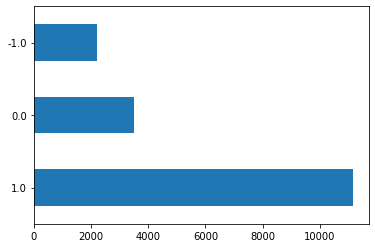

In [21]:
print(tokenised_df['analysis'].value_counts())
tokenised_df['analysis'].value_counts().plot(kind='barh')
plt.show()

In [56]:
summary_df = pd.DataFrame(tokenised_df[['peak', 'analysis']].groupby('peak').value_counts(), columns=['count'])
summary_df = summary_df.reset_index()
summary_df

,peak,analysis,count
0,cardrona,1.0,3011
1,cardrona,0.0,954
2,cardrona,-1.0,591
3,coronet,1.0,4401
4,coronet,0.0,1355
5,coronet,-1.0,770
6,remarkables,1.0,3735
7,remarkables,0.0,1205
8,remarkables,-1.0,850


Calculating overall positive sentiment score in the graph does not work here currently (as of Jan 2022), but is intended to be the number of positive reviews divided by the number of total reviews for any given ski field

In [136]:
selection = alt.selection_multi(fields=["peak"], bind='legend')

chart2 = alt.Chart(summary_df).mark_bar().encode(
    alt.X("analysis:N"),
    alt.Y("count:Q", stack=None, sort='-x'),
    alt.Color("peak"),
    opacity=alt.condition(selection, alt.value(0.7), alt.value(0))
).properties(height=350, width=500).add_selection(selection)

text = alt.Chart(summary_df, width=600, height=400).mark_text(
    align='left', baseline='bottom', dx=+5, dy=-5, fontSize=12,
).encode(
    x=alt.value(0.0),
    y=alt.value(summary_df['count'].max()/1000),
    text='_label:N',
    opacity=alt.condition(selection, alt.value(1.0), alt.value(0.0)),
).transform_calculate(
    _label=''' "Overall positive sentiment score = " + format(0.67, ".2f") ''',
)

alt.layer(chart2, text)

alt.LayerChart(...)

In [ ]:
selection = alt.selection_multi(fields=["peak"], bind='legend')

# chart2 = alt.Chart(summary_df).mark_bar().encode(
#     alt.X("analysis:N"),
#     alt.Y("count:Q", stack=None, sort='-x'),
#     color='peak:N',
#     opacity=alt.condition(selection, alt.value(0.5), alt.value(0)),
#     tooltip='count:Q'
# ).properties(height=350, width=500).add_selection(selection)

# text = alt.Chart(summary_df, width=600, height=400).mark_text(
#     align='left', baseline='bottom', dx=+5, dy=-5, fontSize=12,
# ).encode(
#     x=alt.value(0.0),
#     y=alt.value(summary_df['count'].max()/1000),
#     text='_label:N',
#     opacity=alt.condition(selection, alt.value(1.0), alt.value(0.0)),
# ).transform_calculate(
#     _label=''' "Positive sentiment score = " + format(summary_df['count'].max()), ".2f") ''',
# )

# alt.layer(chart2, text)

In [65]:
# alt.data_transformers.disable_max_rows()

# chart1 = alt.Chart(tokenised_df).mark_circle(size=50).encode(
#     alt.X("polarity"),
#     alt.Y("subjectivity"),
#     alt.Color("peak", 
#               legend=alt.Legend(
#                   title="Peak", 
#                   orient='left',
#                   titleFontSize=15,
#                   labelFontSize=13)
#              ),
#     opacity=alt.condition(alt.selection_multi(fields=["peak"], bind='legend'), alt.value(1), alt.value(0))
# ).properties(height=350, width=500).configure_axis(titleFontSize=20, labelFontSize=15).add_selection(alt.selection_multi(fields=["peak"], bind='legend'))

# chart2 = alt.Chart(summary_df).mark_bar().encode(
#     alt.X("analysis"),
#     alt.Y("count"),
#     alt.Color("peak", legend=alt.Legend(
#                   title="Peak", 
#                   orient='left',
#                   titleFontSize=15,
#                   labelFontSize=13)),
#     opacity=alt.condition(alt.selection_multi(fields=["peak"], bind='legend'), alt.value(1), alt.value(0))
# ).properties(height=350, width=500).add_selection(alt.selection_multi(fields=["peak"], bind='legend'))

# chart1 | chart2

### Approach 3 - HuggingFace transformer

Sentiment analysis on the reviews was performed using the newer HuggingFace's transformers library and their pipeline abstraction.

In [21]:
df = pd.DataFrame(columns=['review_year', 'review_month', 'review_text', 'source'])

for field in fields:
    reviews_df = pd.read_csv(f'path/to/{selected_field}.csv')
    reviews_df.drop('processed_review_text', axis=1, inplace=True)
    reviews_df['source'] = field
    df = pd.concat([df, reviews_df], ignore_index=True)
df.head()

,review_year,review_month,review_text,peak
0,2021,Oct,The ticketing process and hiring process was g...,cardrona
1,2021,Aug,"Excellent team, thank you Laura and the girl d...",cardrona
2,2021,Jul,"Won’t go back in a hurry. Massive long lines, ...",cardrona
3,2021,Mar,We spent 2 hours on the ski field riding the m...,cardrona
4,2021,Feb,Visited as a group of 4 couples and everyone h...,cardrona


In [22]:
df = df.drop_duplicates(subset={"review_text"}, keep='first')
df = preprocess(df)
df.head()

,review_year,review_month,review_text,peak,processed_review_text
0,2021,Oct,The ticketing process and hiring process was g...,cardrona,ticket process hire process be great easy all ...
1,2021,Aug,"Excellent team, thank you Laura and the girl d...",cardrona,"excellent team, thank you laura girl driver wh..."
2,2021,Jul,"Won’t go back in a hurry. Massive long lines, ...",cardrona,"will not go back in hurry. massive long lines,..."
3,2021,Mar,We spent 2 hours on the ski field riding the m...,cardrona,we spent 2 hour on ski field rid mountain cart...
4,2021,Feb,Visited as a group of 4 couples and everyone h...,cardrona,visit a group of 4 couple everyone have an abs...


In [23]:
df['tokenised_sentences'] = df['processed_review_text'].apply(lambda x: sent_tokenize(x))
df.drop(['review_text', 'processed_review_text'], axis=1, inplace=True)
df.head()

,review_year,review_month,peak,tokenised_sentences
0,2021,Oct,cardrona,[ticket process hire process be great easy all...
1,2021,Aug,cardrona,"[excellent team, thank you laura girl driver w..."
2,2021,Jul,cardrona,"[will not go back in hurry., massive long line..."
3,2021,Mar,cardrona,[we spent 2 hour on ski field rid mountain car...
4,2021,Feb,cardrona,[visit a group of 4 couple everyone have an ab...


In [24]:
tokenised_df = df.explode('tokenised_sentences', ignore_index=True)
tokenised_df.head()

,review_year,review_month,peak,tokenised_sentences
0,2021,Oct,cardrona,ticket process hire process be great easy all ...
1,2021,Oct,cardrona,all be well until we meet out instructor (nick...
2,2021,Oct,cardrona,it completely put our kid off.
3,2021,Oct,cardrona,we then go do our own lesson with kid with lit...
4,2021,Oct,cardrona,over all cadrona be well set up for first time...


In [28]:
tokenised_df['subjectivity'] = tokenised_df['tokenised_sentences'].apply(lambda x: TextBlob(x).sentiment.subjectivity)
tokenised_df.head()

,review_year,review_month,peak,tokenised_sentences,subjectivity
0,2021,Oct,cardrona,ticket process hire process be great easy all ...,0.569444
1,2021,Oct,cardrona,all be well until we meet out instructor (nick...,0.668750
2,2021,Oct,cardrona,it completely put our kid off.,0.400000
3,2021,Oct,cardrona,we then go do our own lesson with kid with lit...,0.566667
4,2021,Oct,cardrona,over all cadrona be well set up for first time...,0.477778


In [29]:
from transformers import pipeline

classifier = pipeline("sentiment-analysis")
print(classifier("We are very happy to show you the 🤗 Transformers library."))
results = classifier(["We are very happy to show you the 🤗 Transformers library.", "We hope you don't hate it."])
for result in results:
    print(f"label: {result['label']}, with score: {round(result['score'], 4)}")

No model was supplied, defaulted to distilbert-base-uncased-finetuned-sst-2-english (https://huggingface.co/distilbert-base-uncased-finetuned-sst-2-english)


[{'label': 'POSITIVE', 'score': 0.9997795224189758}]
label: POSITIVE, with score: 0.9998
label: NEGATIVE, with score: 0.5309


In [41]:
tokenised_sentence_list = list(df['tokenised_sentences'])
tokenised_sentence_list = [tokenised_sentence for tokenised_sentence_sublist in tokenised_sentence_list for tokenised_sentence in tokenised_sentence_sublist]

In [46]:
sentiments = classifier(tokenised_sentence_list)

In [69]:
scores = []
labels = []
for item in sentiments:
    if item['label'] == 'NEGATIVE':
        item['score'] = -1*item['score']
    scores.append(item['score'])
    labels.append(item['label'])

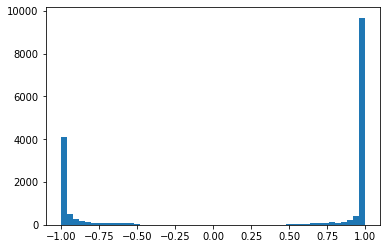

In [71]:
plt.hist(scores, bins=50)
plt.show()

Sentiments are a lot more distinguished now, maybe because the "scores" are more a measure of confidence rather than a measure of polarity itself like in TextBlob

In [70]:
tokenised_df['sentiment'] = labels
tokenised_df['sentiment_score'] = scores
tokenised_df.head()

,review_year,review_month,peak,tokenised_sentences,subjectivity,sentiment,sentiment_score
0,2021,Oct,cardrona,ticket process hire process be great easy all ...,0.569444,POSITIVE,0.990033
1,2021,Oct,cardrona,all be well until we meet out instructor (nick...,0.668750,NEGATIVE,-0.993660
2,2021,Oct,cardrona,it completely put our kid off.,0.400000,NEGATIVE,-0.995861
3,2021,Oct,cardrona,we then go do our own lesson with kid with lit...,0.566667,NEGATIVE,-0.938372
4,2021,Oct,cardrona,over all cadrona be well set up for first time...,0.477778,POSITIVE,0.970559


#### Visualise

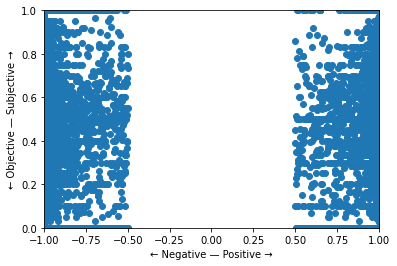

In [73]:
plt.scatter(tokenised_df.sentiment_score, tokenised_df.subjectivity)
plt.xlabel('← Negative — Positive →')
plt.ylabel('← Objective — Subjective →', )
plt.xlim([-1.0, 1.0])
plt.ylim([0.0, 1.0])
plt.show()

In [75]:
alt.data_transformers.disable_max_rows()

DataTransformerRegistry.enable('default')

Review statements can still not be filtered by ski field but the transformers approach does produce a greater difference in polarity (referred to as sentiment_score here). 

In [78]:
selection = alt.selection_multi(fields=["peak"], bind='legend')

chart = alt.Chart(tokenised_df).mark_point(size=50).encode(
    alt.X("sentiment_score"),
    alt.Y("subjectivity"),
    alt.Color("peak", 
              legend=alt.Legend(
                  title="Peak",  
                  orient='left',
                  titleFontSize=15,
                  labelFontSize=13)
             ),
    opacity=alt.condition(selection, alt.value(1), alt.value(0)),
    tooltip='tokenised_sentences'
).properties(height=350, width=500).configure_axis(titleFontSize=20, labelFontSize=15).add_selection(selection)

chart

alt.Chart(...)

In [83]:
tokenised_df['sentiment'].value_counts()

POSITIVE    11077
NEGATIVE     5795
Name: sentiment, dtype: int64

POSITIVE    11077
NEGATIVE     5795
Name: sentiment, dtype: int64


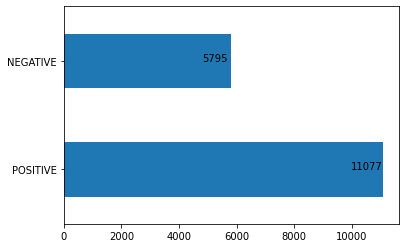

In [92]:
print(tokenised_df['sentiment'].value_counts())
tokenised_df['sentiment'].value_counts().plot(kind='barh')

plt.annotate(tokenised_df['sentiment'].value_counts()[1], xy=(tokenised_df['sentiment'].value_counts()[1]-1000, 1))
plt.annotate(tokenised_df['sentiment'].value_counts()[0], xy=(tokenised_df['sentiment'].value_counts()[0]-1100, 0))

plt.show()

In [95]:
summary_df = pd.DataFrame(tokenised_df[['peak', 'sentiment']].groupby('peak').value_counts(), columns=['count'])
summary_df = summary_df.reset_index()
summary_df

,peak,sentiment,count
0,cardrona,POSITIVE,3010
1,cardrona,NEGATIVE,1546
2,coronet,POSITIVE,4361
3,coronet,NEGATIVE,2165
4,remarkables,POSITIVE,3706
5,remarkables,NEGATIVE,2084


In [123]:
overall_positive_sentiment_scores = []
for peak in peaks:
    counts = summary_df.loc[summary_df['peak'] == peak]
    overall_positive_sentiment_score = counts.iloc[0]['count']/(counts.iloc[0]['count'] + counts.iloc[1]['count'])
    overall_positive_sentiment_scores.append(overall_positive_sentiment_score)

overall_positive_sentiment_scores = [score for score in overall_positive_sentiment_scores for _ in (0, 1)]
summary_df['overall_sentiment_score'] = overall_positive_sentiment_scores
summary_df

,peak,sentiment,count,overall_sentiment_score
0,cardrona,POSITIVE,3010,0.660667
1,cardrona,NEGATIVE,1546,0.660667
2,coronet,POSITIVE,4361,0.668250
3,coronet,NEGATIVE,2165,0.668250
4,remarkables,POSITIVE,3706,0.640069
5,remarkables,NEGATIVE,2084,0.640069


In [125]:
selection = alt.selection_multi(fields=["peak"], bind='legend')

chart2 = alt.Chart(summary_df).mark_bar().encode(
    alt.X("sentiment:N"),
    alt.Y("count:Q", stack=None, sort='-x'),
    alt.Color("peak"),
    opacity=alt.condition(selection, alt.value(0.7), alt.value(0))
).properties(height=350, width=500).add_selection(selection)

text = alt.Chart(summary_df, width=600, height=400).mark_text(
    align='left', baseline='bottom', dx=+5, dy=-5, fontSize=12,
).encode(
    x=alt.value(0.0),
    y=alt.value(summary_df['count'].max()/1000),
    text='_label:N',
    opacity=alt.condition(selection, alt.value(1.0), alt.value(0.0)),
).transform_calculate(
    _label=''' "Overall positive sentiment score = " + format(datum['overall_sentiment_score'], ".3f") ''',
)

alt.layer(chart2, text)

alt.LayerChart(...)

Overall positive sentiment score calculation working now, but now we need to work out how to filter the sentences based on what topic they are referring to and perform true aspect-based sentiment analysis.

Retrospective note: Due to the time available for this project, aspect-based sentiment analysis (i.e. combining the results of topic modelling and polarity/subjectivity) was left for future work by Qrious. Additional work could also involve the comparison of results using different approachs (e.g. HuggingFace vs TextBlob) as the relationships between polarity and subjectivity observed in one approach was quite different to the other - TextBlob showed a wider range of polarity as subjectivity increased, while HuggingFace transformers showed roughly equal variance in sentiment across the whole range of subjectivity, albeit with greater separation in the polarity of statements as compared to the TextBlob approach.